# Steganography using Software (PS) and Hardware accelerated (PL)

Steganography is a method of hiding secret information in digital files such as images, audio files etc. In this project , we implemented an FPGA based solution to hide a secret word in images by changing some pixel values at some positions without being detected by human eyes. Moreover, it can also reveal the hidden word in an encoded image.

The goal of our project is to perform the steganography technique faster using the FPGA and the CPU together rather than the Software only solution. We have also implemented a Software Only solution which is used to compare the execution time and speed ups between both.

##### contents:

- [Import libraries](#Import-libraries)
- [Download Images](#Download-Images)
- [Initializations](#Initializations)
- [Functions](#Functions)
- [Encoding & Decoding using PL](#Encoding-&-Decoding-using-PL)
- [Encoding & Decoding using CPU](#Encoding-&-Decoding-using-CPU)
- [Time Comparison](#Time-Comparison)
- [Encoding & Decoding multiple different images using PL](#Encoding-&-Decoding-multiple-different-images-using-PL)
- [Encoding & Decoding multiple different images using CPU](#Encoding-&-Decoding-multiple-different-images-using-CPU)
- [Time comparison for multi images](#Time-comparison-for-multi-images)
- [Speedup graphs](#Speedup-graphs)


# Import libraries

1. **PIL** library to load the image   
2. **numpy** to store the pixel array of the image
3. **matplotlib** to show figures for time comparison
4. **requests** to call a GET request to download Images
5. **bs4** to scrap images
6. **time** for time measurements
7. **plotly** for 3d-plots
8. **pandas** for dataframe and keeping track of history-speedup data


- requests need to be installed : pip3 install requests
- bs4 need to be installed : pip3 install bs4

In [1]:
from pynq import Overlay, allocate
import pynq.lib.dma
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline
import time
import re
import requests
from bs4 import BeautifulSoup
import plotly
import plotly.graph_objs as go
import plotly.express as pxx
import pandas as pd
import os

# Download Images

Downloading 10 different high resoultion images from "https://newevolutiondesigns.com" using web-scraping and saving them into folder images/name.jpg

In [ ]:
url = "https://newevolutiondesigns.com/25-best-photo-manipulation-tutorials"

headers = {'User-Agent': "Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/77.0.3865.90 Safari/537.36"}
response = requests.request("GET", url, headers=headers)
data = BeautifulSoup(response.text, 'html.parser')# find all with the image tag
images = data.find_all('img', src=True)

image_src = [x['src'] for x in images]# select only jp format images
image_src = [x for x in image_src if x.endswith('.jpg')]
image_count = 1

if not os.path.isdir("images"):
    os.mkdir("images")

for image in image_src:
    
    with open('images/'+str(image_count)+'.jpg', 'wb') as f:
        res = requests.get("https://newevolutiondesigns.com/"+image)
        f.write(res.content)
        
    image_count = image_count+1
    if image_count == 11:
        break
    
print("Downloading finished!")

# Initializations

Populating the the Programmable Logic with the Steganography overlay and creating DMA and pixel objects

In [2]:
overlay = Overlay('Steganography.bit')

dma0 = overlay.axi_dma_0
dma1 = overlay.axi_dma_1
px=overlay.pixel

Loading and displaying one of the downloaded images to be used for encoding and decoding with PS and PL

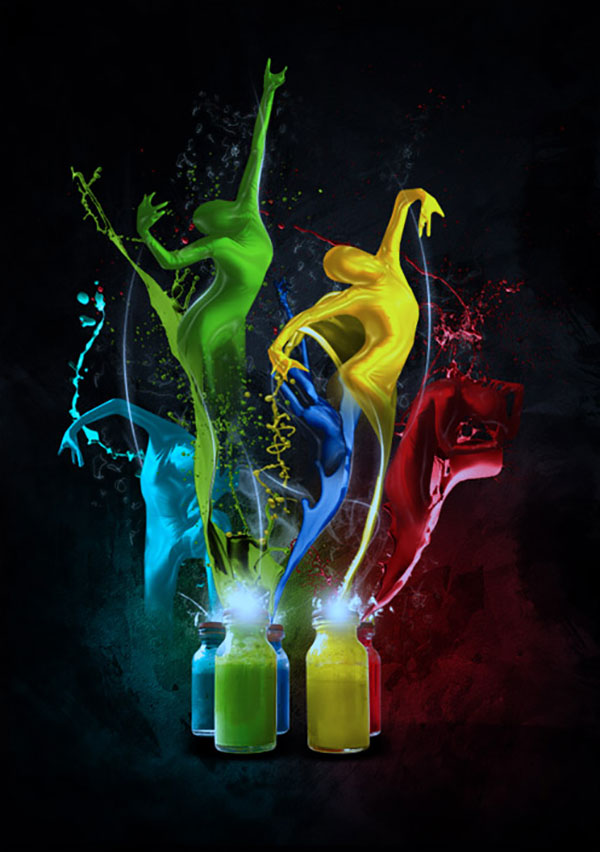

In [3]:
im = Image.open('images/2.jpg')
im

Allocating buf_in and out_buffer and appending image data to input buffer

In [4]:
buf_in = allocate((im.height,im.width,3,), np.uint32, cacheable=True )
out_buffer = allocate(shape=(im.height,im.width,3,), dtype=np.uint32,  cacheable=True )

buf_in[:] = np.array(im)

Creating a dictionary to store execution time (encoding, decoding) for PS and PL for one Image and multiple images, It is used for time Comparison. image_size stores the size of the image and word_size stores length of the secret word for each cycle

In [5]:
encDecTime = {"pl_encoding":[], "pl_decoding":[], "ps_encoding":[], "ps_decoding":[],
              "pl_encoding_multi":[], "ps_encoding_multi": [] , "pl_decoding_multi":[], "ps_decoding_multi":[]}
image_size=[] 
word_size=[]
image_size_multi = []
word_size_multi=[]

# Functions


convertWordToDecimal Function is used for converting the secret word to corresponding ascii value.
- Parameter: string
- Return: int 

In [6]:
def convertWordToDecimal(wordString):
    wordInDecimal = 0
    
    for character in wordString:
        wordInDecimal = wordInDecimal*100 + ord(character)
        
    return wordInDecimal

getHiddenCharacters Function is used for finding the secret word from the corresponding ascii value.

- Parameter: int
- Return: string

In [7]:
def getHiddenCharacters(decimalValue):
    
    word = ""
    num = int(decimalValue)
    
    for x in range(len(str(num))//2):
        word += chr(int(num)%100)
        num = num // 100
    return word

convert function is used by the PS. It converts a decimal number to a Binary number
- Parameter: int
- Return: int

In [8]:
def convert(n):
    binn = 0
    rem = 0
    i=1
    step = 1
    while (n != 0):
        rem = n % 2
        n //= 2
        binn += rem * i
        i *= 10
    return binn

decode function is used by the PS to get the binary value of the embedded ascii values by combining the LSBs.
- Parameter: int

In [9]:
def decode(data):
    global finalChar
    bit=0

    if(data % 2 == 0):
        bit = 0
    elif(data % 2 != 0):
        bit=1
        
    finalChar= finalChar*10+bit

convertBinInt Function is used by the PS to get decimal value from a binary number
- Parameter: int
- Return: int

In [10]:
def convertBinInt(n):
    
    dec=0
    rem=0
    b = 0
    i = 7
    
    while (n != 0):
        b=pow(10,i)
        rem = n // b
        n =n % b
        dec += rem * pow(2, 7-i)
        i -= 1
        
    return dec

getDecimal function is used by the PS to get the last two digits (which represents one character) of the corresponding ascii values passed to this function.
- Parameter: int
- Return: int

In [11]:
def getDecimal(n):
    num = 0
    num = n % 100
    return num

Pixel Function is the main function for PS. It performs encoding and decoding based on the selector value.
- Parameters:
  - decimalInput: (int) &nbsp;&nbsp; Ascii values to embed
  - selector: (int) &nbsp;&nbsp;       to select encoding or decoding
  - streamCount: (int)&nbsp;&nbsp;     represent size of the input data stream
  - buf_in_ps_1d: (list)&nbsp;&nbsp;   list which holds the chosen pixels values
  - imageHeight: (int)  &nbsp;&nbsp;   height of the individual images 
  - imageWidth: (int)  &nbsp;&nbsp;    width of the individual images


In [12]:
finalChar=0
decimalOut = 0

def pixel(decimalInput, selector,streamCount, buf_in_ps_1d, imageHeight, imageWidth):
    
    decimalCounter = 0
    global decimalOut
    global finalChar
    charDecimalString = ''
    
    
    for i in range(streamCount):
        
        if not selector:
            #Encoding part
            
            if (i == 0):
                finalChar=0
                decNum = decimalInput
            
            addNum=0
            if(decimalCounter % 8 == 0):
                lastDecimalVal = getDecimal(decNum)
                decNum = decNum // 100
                charIn=convert(lastDecimalVal)

            addNum=charIn%10
            charIn=charIn//10

            if(buf_in_ps_1d[i] % 2 == 0 and addNum == 1):
                buf_in_ps_1d[i] += 1

            elif(buf_in_ps_1d[i] % 2 != 0 and addNum == 0):
                buf_in_ps_1d[i] -= 1

            decimalCounter=decimalCounter+1

                    
        elif selector:
            #Decoding part
                
            decode(buf_in_ps_1d[i])
            decimalCounter=decimalCounter+1

            if(decimalCounter == 8):

                charDecimalString += str(convertBinInt(finalChar))
                decimalCounter=0
                finalChar=0


            if (i == streamCount-1):
                decimalOut = int(charDecimalString)
                

    return buf_in_ps_1d

# Encoding & Decoding using PL

## Encoding process

Converting a word into a decimal value. This word represents the secret word which will be encoded in an image

In [13]:
encoding_word="GOLD"
wordInDecimal = convertWordToDecimal(encoding_word)

Setting starting and ending positions for encoding and decoding 

In [14]:
position1 = 500
position2 = position1-1+len(encoding_word)*8

Register map: &nbsp; setting Register values
- in_decimal_i : &nbsp;&nbsp;holds the the decimal value of the word
- selector: &nbsp;&nbsp; holds 0 for encoding mode
- stream_count: &nbsp;&nbsp; holds the number of values which need to be proccessed on the fpga

In [15]:
px.register_map.in_decimal_i=wordInDecimal 
px.register_map.selector = 0        
px.register_map.stream_count= position2 - position1 +1

Creating 1D lists from input and the output buffers which were created previously.

In [16]:
in_buffer_1d=buf_in.ravel()
out_buffer_1d=out_buffer.ravel()

Here we start the encoding process using the PL . this process is done 10 times which will give us a better look on how the FPGA performs, and after each time, we append the execution time for the encoding process to a list which will be used for time comparison in the end.

In [21]:
encDecTime["pl_encoding"] = []
image_size = []
word_size = []
for i in range (10):
    word_size.append(len(encoding_word)) # to keep track of embedding word length
    image_size.append(int(im.height*im.width))
    start_time = time.time()
    dma0.sendchannel.transfer(in_buffer_1d[position1-1:position2])
    dma1.recvchannel.transfer(out_buffer_1d[position1-1:position2])
    dma0.sendchannel.wait()
    dma1.recvchannel.wait()
    end_time = time.time()
    encDecTime["pl_encoding"].append(end_time - start_time)

Generating output buffer which will be reshaped to 3D buffer to display the encoded image

In [22]:
out_buffer_1d[position2:] = in_buffer_1d[position2:]
out_buffer_1d[:position1-1] = in_buffer_1d[:position1-1]

creating a 3D buffer by Reshaping the 1D out buffer which holds the image data

In [23]:
out_buffer_3d = np.copy(out_buffer_1d).reshape(im.height,im.width,3)

Displaying the encoded image from the 3D out buffer

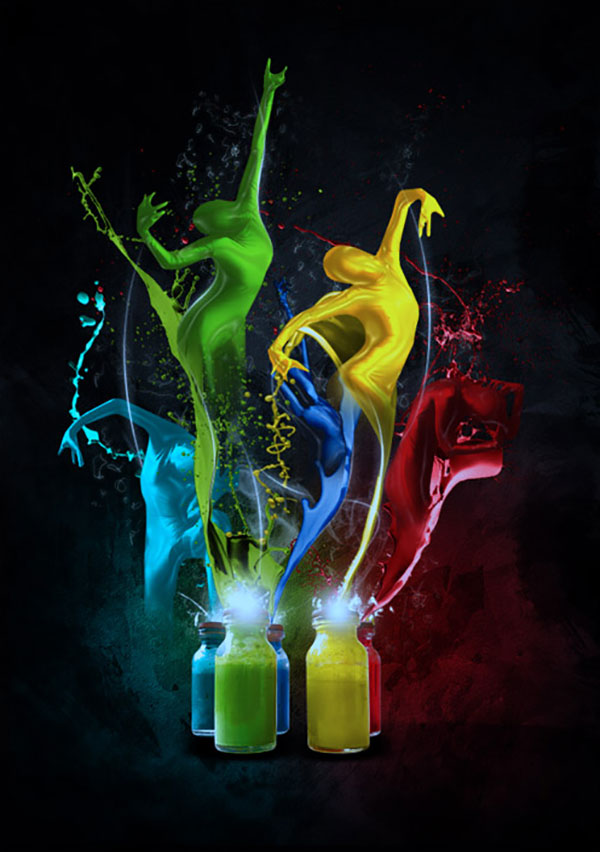

In [24]:
encodedImage = Image.fromarray((out_buffer_3d).astype('uint8'))

display(encodedImage)

## Decoding process

Register map : &nbsp;setting Register values
- selector: holds 1 for decoding mode
- stream_count: holds the number of values which need to be proccessed on the fpga

In [25]:
px.register_map.selector = 1
px.register_map.stream_count= position2 - position1 +1

Here we start the decoding process using the PL. this process is done 10 times and after each time, we append the execution time for the decoding process to a list which will be used for time comparison in the end.

In [27]:
encDecTime["pl_decoding"] = []
for i in range (10):
    start_time = time.time()
    dma0.sendchannel.transfer(out_buffer_1d[position1-1:position2])
    dma1.recvchannel.transfer(out_buffer_1d[position1-1:position2])
    dma0.sendchannel.wait()
    dma1.recvchannel.wait()
    end_time = time.time()
    encDecTime["pl_decoding"].append(end_time - start_time)

Getting the decoded ascii values using register map and find the secret charchters by passing this value the function getHiddenCharacters

In [28]:
decimalValues = px.register_map.in_decimal_o
getHiddenCharacters(decimalValues)

'GOLD'

# Encoding & Decoding using CPU

## Encoding process

We will use the same word used for PL. Here we set the the selector value to 0 (encoding), stream count and we also create a 1D array from the in_buffer_1d which was created previously

In [29]:
decimalInput = wordInDecimal

selector=0
streamCount= position2 - position1 +1 

buf_in_ps_1d = in_buffer_1d

Here we start the encoding process using the Software only. this process is done 10 times which will give us a better look on how the cpu performs, and after each time, we append the execution time for the encoding process to a list which will be used for time comparison in the end.

In [30]:
encDecTime["ps_encoding"] =[]
for i in range(10):
    start_time = time.time()
    out_buffer_ps_1d = pixel(decimalInput,selector,streamCount,buf_in_ps_1d[position1-1:position2],im.height,im.width)
    end_time = time.time()
    encDecTime["ps_encoding"].append(end_time - start_time)

Generating output buffer which will be reshaped to 3D buffer to display the encoded image

In [31]:
final_1d_buffer = in_buffer_1d
final_1d_buffer[:position1-1]=buf_in_ps_1d[:position1-1]
final_1d_buffer[position1-1:position2] = out_buffer_ps_1d
final_1d_buffer[position2:]=buf_in_ps_1d[position2:]

Displaying the encoded image from the out_buffer_ps_3d

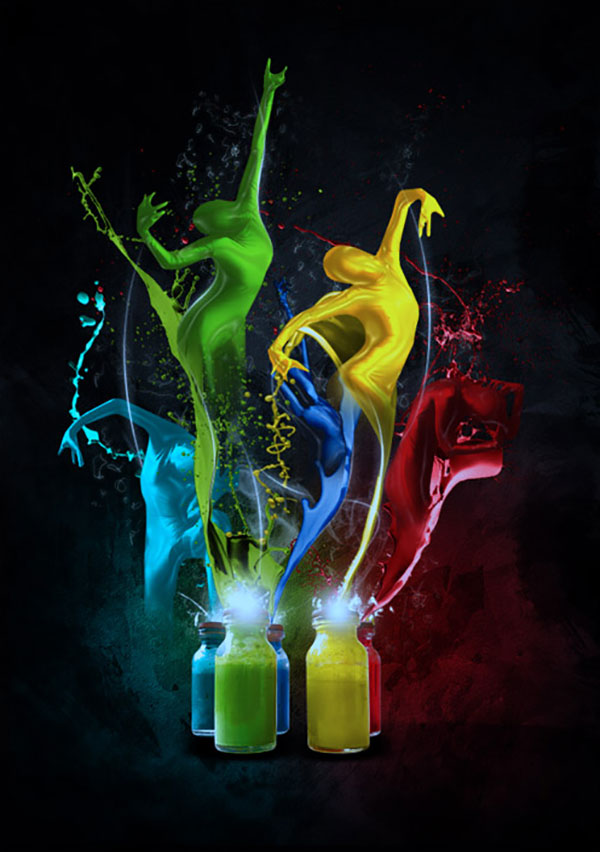

In [32]:
out_buffer_ps_3d = np.copy(final_1d_buffer).reshape(im.height,im.width,3)
im_out_ps = Image.fromarray((out_buffer_ps_3d).astype('uint8'))
display(im_out_ps)

## Decoding process


Here we set the mode to decoding ( selector = 1) and also set the stream count.

In [33]:
selector=1

streamCount= position2 - position1 +1 
buf_in_ps_decode=out_buffer_ps_3d.ravel()

Starting the decoding process using the Software only, we call the Pixel function and pass the required parameters

In [34]:
encDecTime["ps_decoding"] = []
for i in range(10):
    start_time = time.time()
    out_buffer_ps_3d = pixel(1,selector,streamCount,buf_in_ps_decode[position1-1:position2],im.height, im.width)
    end_time = time.time()
    encDecTime["ps_decoding"].append(end_time - start_time)


We pass the decimalOut value which we get after executing the Pixel function to the getHiddenCharacters to find out the hidden word

In [35]:
getHiddenCharacters(decimalOut)

'GOLD'

# Time Comparison

### PS vs. PL encoding time comparison

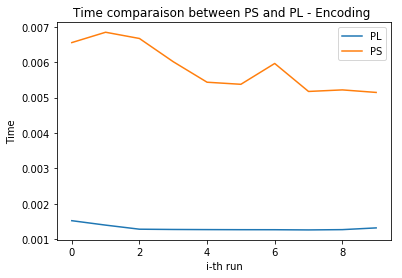

In [36]:
x1 = [i for i in range(10)]
y1 = encDecTime["pl_encoding"]

# plotting the line 1 points 
plt.plot(x1, y1, label = "PL")
# line 2 points
x2 = [i for i in range(10)]
y2 = encDecTime["ps_encoding"]
# plotting the line 2 points 
plt.plot(x2, y2, label = "PS")
plt.xlabel('i-th run')
# Set the y axis label of the current axis.
plt.ylabel('Time')
# Set a title of the current axes.
plt.title('Time comparaison between PS and PL - Encoding ')
# show a legend on the plot
plt.legend()
# Display a figure.
plt.show()

In [ ]:
plt.close() #closing the plot

### PS vs. PL decoding time comparison

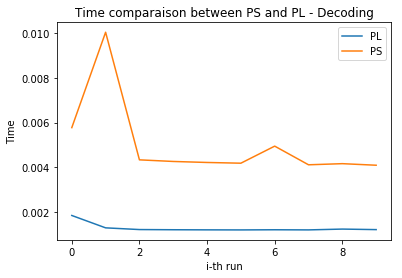

In [37]:
x1 = [i for i in range(10)]
y1 = encDecTime["pl_decoding"]

# plotting the line 1 points 
plt.plot(x1, y1, label = "PL")
# line 2 points
x2 = [i for i in range(10)]
y2 = encDecTime["ps_decoding"]
# plotting the line 2 points 
plt.plot(x2, y2, label = "PS")
plt.xlabel('i-th run')
# Set the y axis label of the current axis.
plt.ylabel('Time')
# Set a title of the current axes.
plt.title('Time comparaison between PS and PL - Decoding')
# show a legend on the plot
plt.legend()
# Display a figure.
plt.show()

In [ ]:
plt.close() #closing the plot

In [ ]:
#free up some space on the memory by deleting all buffers
try :
    del in_buffer_1d
    del final_1d_buffer
    del buf_in_ps_1d
    del out_buffer_ps_1d
    del out_buffer_1d
    del buf_in
    del out_buffer
    del out_buffer_ps_3d
    del buf_in_ps_decode
    del im_out_ps
    del out_buffer_3d
    
except: print("error")

# Encoding & Decoding multiple different images using PL

## Encoding process

encodeMultiple function is used to hide the secret word in multiple images. 

In [38]:
def encodeMultiple(imagePaths):
    encDecTime["pl_encoding_multi"] = []
    
    #iterate over imagePaths list and do the process for every single image
    for image in imagePaths:
        
        imageToEncode = Image.open(image)
        buf_in = allocate((imageToEncode.height, imageToEncode.width,3,), np.uint32, cacheable=True )
        out_buffer = allocate(shape=(imageToEncode.height, imageToEncode.width,3,), dtype=np.uint32,  cacheable=True )
        buf_in[:] = np.array(imageToEncode)
        word_size_multi.append(len(encoding_word)) # to keep track of embedding word length
        image_size_multi.append(int(imageToEncode.height * imageToEncode.width))
        
        #creating 1D arrays from buf_in and out_buffer
        in_buffer_1d=buf_in.ravel()
        out_buffer_1d=out_buffer.ravel()
        
        #sending values of the specified pixels and measuring the time for the process
        start_time = time.time()
        dma0.sendchannel.transfer(in_buffer_1d[position1-1:position2])
        dma1.recvchannel.transfer(out_buffer_1d[position1-1:position2])
        dma0.sendchannel.wait()
        dma1.recvchannel.wait()
        end_time = time.time()
        
        out_buffer_1d[position2:] = in_buffer_1d[position2:]
        out_buffer_1d[:position1-1] = in_buffer_1d[:position1-1]
        listOfOutBuffers.append(out_buffer_1d)
        
        #adding the time to thhe dictionary
        encDecTime["pl_encoding_multi"].append(end_time - start_time) 
        
        del in_buffer_1d
        del buf_in ,out_buffer, out_buffer_1d


In [40]:
listOfOutBuffers = []
word_size_multi = []
image_size_multi = []
imagePaths = !ls images/*.jpg
#wordInDecimal = convertWordToDecimal("HITT")
streamCount= position2 - position1 +1 
px.register_map.in_decimal_i=wordInDecimal 
px.register_map.selector = 0
px.register_map.streamCount= streamCount

encodeMultiple(imagePaths)

## Decoding process

decode_multiple function is used to decode the secret word from multiple images. 

In [41]:
def decode_multiple():
    encDecTime["pl_decoding_multi"] = []
    
    for buf_1d in listOfOutBuffers:

        start_time = time.time()
        dma0.sendchannel.transfer(buf_1d[position1-1:position2])
        dma1.recvchannel.transfer(buf_1d[position1-1:position2])
        dma0.sendchannel.wait()
        dma1.recvchannel.wait()
        end_time = time.time()
        decimal_values = px.register_map.in_decimal_o
        
        encDecTime["pl_decoding_multi"].append(end_time - start_time)


In [43]:
px.register_map.selector = 1
streamCount= position2 - position1 +1 
decode_multiple()

Displaying the decoded ascii values as corresponding characters

In [44]:
decimalValues = px.register_map.in_decimal_o
getHiddenCharacters(decimalValues)

'GOLD'

# Encoding & Decoding multiple different images using CPU

## Encoding process

encode_multiple_ps function is used to hide the secret word in multiple images using Software only

In [45]:
def encode_multiple_ps(image_paths):
    
    for image in image_paths:
        
        imageToEncode = Image.open(image)
        
        buf_in = allocate((imageToEncode.height, imageToEncode.width,3,), np.uint32, cacheable=True )
        out_buffer = allocate(shape=(imageToEncode.height, imageToEncode.width,3,), dtype=np.uint32,  cacheable=True )
        buf_in[:] = np.array(imageToEncode)
        buf_in_ps=buf_in.ravel()
        
        start_time = time.time()
        out_buffer_ps_1d= pixel(decimalInput,selector,streamCount,buf_in_ps[position1-1:position2],imageToEncode.height,imageToEncode.width )
        end_time = time.time()
        
        temp_1d_buffer = buf_in_ps
        temp_1d_buffer[:position1-1]=buf_in_ps[:position1-1]
        temp_1d_buffer[position1-1:position2] = out_buffer_ps_1d
        temp_1d_buffer[position2:]=buf_in_ps[position2:]
        
        listOfOutBuffersPS.append((temp_1d_buffer,imageToEncode.height,imageToEncode.width))
        
        encDecTime["ps_encoding_multi"].append(end_time - start_time)
        del temp_1d_buffer
        del buf_in ,out_buffer, buf_in_ps

Encoding function call with selector values as 0

In [46]:
listOfOutBuffersPS = []
imagePaths = !ls images/*.jpg

selector=0
streamCount= position2 - position1 +1
decimalInput = wordInDecimal

encDecTime["ps_encoding_multi"] = []
encode_multiple_ps(imagePaths)

## Decoding process

decode_multiple_ps function is used to decode the secret word from multiple images using the Software only. 

In [47]:
def decode_multiple_ps():
    
    for buf in listOfOutBuffersPS:
        height = buf[1]
        width = buf[2]
        
        buf_1d = buf[0]
        
        start_time = time.time()
        out_buffer_ps = pixel(decimalInput, selector, streamCount, buf_1d[position1-1:position2], height, width)
        end_time = time.time()
        
        encDecTime["ps_decoding_multi"].append(end_time - start_time)

In [48]:
selector=1
stream_count= position2 - position1 +1
encDecTime["ps_decoding_multi"] = []

decode_multiple_ps()

Displaying the decoded ascii values as corresponding characters

In [49]:
getHiddenCharacters(decimalOut)

'GOLD'

# Time comparison for multi images

## Encoding time

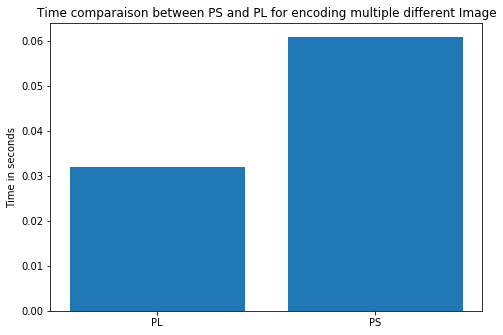

In [50]:
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
method = ['PS', 'PL']
timing = [sum(encDecTime["ps_encoding_multi"]), sum(encDecTime["pl_encoding_multi"])]
ax.bar(method,timing)
plt.title('Time comparaison between PS and PL for encoding multiple different Image')
plt.ylabel('Time in seconds')

plt.show()

## Decoding time

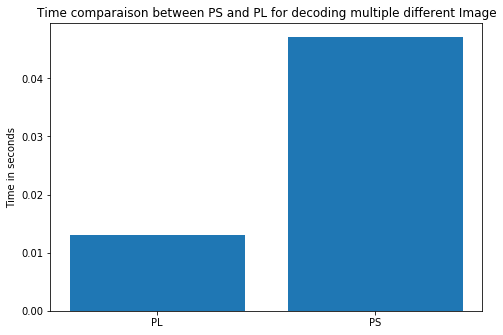

In [51]:
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
method = ['PS', 'PL']
timing = [sum(encDecTime["ps_decoding_multi"]), sum(encDecTime["pl_decoding_multi"])]
ax.bar(method,timing)
plt.title('Time comparaison between PS and PL for decoding multiple different Image')
plt.ylabel('Time in seconds')

plt.show()

# Speedup graphs

Pulling History speedup data from CSV files

In [52]:
try:
  df1 = pd.read_csv('data_encoding.csv')
  df2 = pd.read_csv('data_decoding.csv')
  df3 = pd.read_csv('data_multi_encoding.csv')
  df4 = pd.read_csv('data_multi_decoding.csv')
except:
  print("files are not present")

files are not present


- x,y,z,w: FPGA timing
- xc,yc,zc,wc: CPU timing

In [53]:
x=encDecTime['pl_encoding']
y=encDecTime['pl_decoding']
z=encDecTime['pl_encoding_multi']
w=encDecTime['pl_decoding_multi']

xc=encDecTime['ps_encoding']
yc=encDecTime['ps_decoding']
zc=encDecTime['ps_encoding_multi']
wc=encDecTime['ps_decoding_multi']

Calculating speedup values and storing it into list

In [54]:
speedupsEncoding=[a/b for a, b in zip(xc, x)]

speedupsDecoding=[a/b for a, b in zip(yc, y)]

speedupsMultiEncoding=[a/b for a, b in zip(zc, z)]

speedupsMultiDecoding=[a/b for a, b in zip(wc, w)]

generating Better performer lists

In [55]:
speedupsBetterEncoding=[ 'FPGA' if(a>1) else "CPU" for a in speedupsEncoding]
speedupsBetterDecoding=[ 'FPGA' if(a>1) else "CPU" for a in speedupsDecoding]

speedupsBetterMultiEncoding=[ 'FPGA' if(a>1) else "CPU" for a in speedupsMultiEncoding]
speedupsBetterMultiDecoding=[ 'FPGA' if(a>1) else "CPU" for a in speedupsMultiDecoding]

data frame for Encoding Speedup

In [56]:
SpeedupEncoding = {'speedupsEncoding': speedupsEncoding,
        'Better': speedupsBetterEncoding,
        'size of image-px': image_size,
        'size of word': word_size
        }

df = pd.DataFrame(SpeedupEncoding, columns = ['speedupsEncoding', 'Better','size of image-px','size of word'])

appending the history speedup data

In [57]:
try:
  df=df.append(df1)
except:
  print("no file existing") 

no file existing


updating/writing the dataframe to csv files

In [58]:
df.to_csv(r'data_encoding.csv', index = False)

Plotting Encdoing Speedup with word size and image size

In [60]:
plotly.offline.init_notebook_mode()
fig = pxx.scatter_3d(df, x='size of word', y='size of image-px', z='speedupsEncoding',
              color='Better')
fig.show()

data frame for Decoding Speedup

In [61]:
SpeedupDecoding = {'speedupsDecoding': speedupsDecoding,
        'Better': speedupsBetterDecoding,
        'size of image-px': image_size,
        'size of word': word_size
        }

df_d = pd.DataFrame(SpeedupDecoding, columns = ['speedupsDecoding', 'Better','size of image-px','size of word'])

appending the history speedup data

In [62]:
try:
  df_d=df_d.append(df2)
except:
  print("no file existing") 

no file existing


updating/writing the dataframe to csv files

In [63]:
df_d.to_csv(r'data_decoding.csv', index = False)

Plotting Decdoing Speedup with word size and image size

In [64]:
plotly.offline.init_notebook_mode()
fig = pxx.scatter_3d(df_d, x='size of word', y='size of image-px', z='speedupsDecoding',
              color='Better')
fig.show()

data frame for Encoding Multi Image Speedup

In [65]:
SpeedupMultiEncoding = {'Speedups Multi Encoding': speedupsMultiEncoding,
        'Better': speedupsBetterMultiEncoding,
        'size of image-px': image_size_multi,
        'size of word': word_size_multi
        }

df_m = pd.DataFrame(SpeedupMultiEncoding, columns = ['Speedups Multi Encoding', 'Better','size of image-px','size of word'])

appending the history speedup data

In [66]:
try:
  df_m=df_m.append(df3)
except:
  print("no file existing") 

no file existing


updating/writing the dataframe to csv files

In [67]:
df_m.to_csv(r'data_multi_encoding.csv', index = False)

Plotting Encdoing Multi Image Speedup with word size and image size

In [68]:
plotly.offline.init_notebook_mode()
fig = pxx.scatter_3d(df_m, x='size of word', y='size of image-px', z='Speedups Multi Encoding',
              color='Better')
fig.show()

data frame for Decoding Multi Image Speedup

In [69]:
speedupMultiDecoding = {'Speedup Multi Decoding': speedupsMultiDecoding,
        'Better': speedupsBetterMultiDecoding,
        'size of image-px': image_size_multi,
        'size of word': word_size_multi
        }

df_m = pd.DataFrame(speedupMultiDecoding, columns = ['Speedup Multi Decoding', 'Better','size of image-px','size of word'])

appending the history speedup data

In [70]:
try:
  df_m=df_m.append(df4)
except:
  print("no file existing")

no file existing


updating/writing the dataframe to csv files

In [71]:
df_m.to_csv(r'data_multi_decoding.csv', index = False)

Plotting Decdoing Multi Image Speedup with word size and image size

In [72]:
plotly.offline.init_notebook_mode()
fig = pxx.scatter_3d(df_m, x='size of word', y='size of image-px', z='Speedup Multi Decoding',
              color='Better')
fig.show()